# Курсовой проект

Проведем разведочный анализ данных для датасета "Goodreads-books" (https://www.kaggle.com/jealousleopard/goodreadsbooks).

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from pandas.api.types import CategoricalDtype

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [3]:
label_font = {
    "fontsize": 12,
    "family": "serif",
    "fontweight":"bold"
}

Сначала сохраним анализируемые данные в датафрейм Pandas и проведем небольшую предобработку.

In [4]:
df = pd.read_csv('books.csv', error_bad_lines=False, sep='\,', engine='python')

# Перед некоторыми значениями в столбце bookID присутствует "
df['bookID'] = df['bookID'].str.lstrip('"')

# Удаляем лишние знаки, которые служили для разделения записей в csv
df['publisher'] = df['publisher;;;'].str.rstrip(';;;')
df['publisher'] = df['publisher'].str.rstrip('"')

# Корректировка названия столбца
df['num_pages'] = df['  num_pages']

# В ноябре и июне 30 дней
df['publication_date'] = df['publication_date'].str.replace('6/31', '6/30')
df['publication_date'] = df['publication_date'].str.replace('11/31', '11/30')
df['publication_date'] = pd.to_datetime(df['publication_date'], format='%m/%d/%Y')

df.drop(columns=['publisher;;;', '  num_pages'], inplace=True)

df.head(10)

,bookID,title,authors,average_rating,isbn,isbn13,language_code,ratings_count,text_reviews_count,publication_date,publisher,num_pages
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,0439785960,9780439785969,eng,2095690,27591,2006-09-16,Scholastic Inc.,652
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,0439358078,9780439358071,eng,2153167,29221,2004-09-01,Scholastic Inc.,870
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,0439554896,9780439554893,eng,6333,244,2003-11-01,Scholastic,352
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,eng,2339585,36325,2004-05-01,Scholastic Inc.,435
4,8,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,0439682584,9780439682589,eng,41428,164,2004-09-13,Scholastic,2690
5,9,"Unauthorized Harry Potter Book Seven News: """"H...",W. Frederick Zimmerman,3.74,0976540606,9780976540601,en-US,19,1,2005-04-26,Nimble Books,152
6,10,Harry Potter Collection (Harry Potter #1-6),J.K. Rowling,4.73,0439827604,9780439827607,eng,28242,808,2005-09-12,Scholastic,3342
7,12,The Ultimate Hitchhiker's Guide: Five Complete...,Douglas Adams,4.38,0517226952,9780517226957,eng,3628,254,2005-11-01,Gramercy Books,815
8,13,The Ultimate Hitchhiker's Guide to the Galaxy ...,Douglas Adams,4.38,0345453743,9780345453747,eng,249558,4080,2002-04-30,Del Rey Books,815
9,14,The Hitchhiker's Guide to the Galaxy (Hitchhik...,Douglas Adams,4.22,1400052920,9781400052929,eng,4930,460,2004-08-03,Crown,215


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11127 entries, 0 to 11126
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   bookID              11127 non-null  object        
 1   title               11127 non-null  object        
 2   authors             11127 non-null  object        
 3   average_rating      11127 non-null  float64       
 4   isbn                11127 non-null  object        
 5   isbn13              11127 non-null  int64         
 6   language_code       11127 non-null  object        
 7   ratings_count       11127 non-null  int64         
 8   text_reviews_count  11127 non-null  int64         
 9   publication_date    11127 non-null  datetime64[ns]
 10  publisher           11127 non-null  object        
 11  num_pages           11127 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(4), object(6)
memory usage: 1.0+ MB


Пропусков в анализируемом наборе данных нет. Он содержит 12 признаков:
- bookID - уникальный идентификатор книги в данном датасете;
- title - название книги;
- authors - автор книги (если авторов несколько они разделены символом /);
- average_rating - средний рейтинг книги;
- isbn - уникальный идентификатор книги International Standard Book Number;
- isbn13 - уникальный идентификатор книги International Standard Book Number в 13-значном формате (ISBN состоит из 11 символов);
- language_code - основной язык книги;
- ratings_count - количество оценок, которые получила книга;
- text_reviews_count - количество рецензий, написанных на данную книгу;
- publication_date - дата публикации;
- publisher - издатель;
- num_pages - количество страниц.

Изучение признаков `bookID`, `isbn` и `isbn13` не представляет на мой взгляд практического интереса, так как они являются уникальными идентификаторами книг.

In [6]:
df.drop(columns=['bookID', 'isbn', 'isbn13'], inplace=True)

Разобьем признак `publication_date` на дополнительные, отвечающие за год, месяц и день. Также добавим переменную, описывающую день недели. После этого можно удалить изначальную переменную из анализа.

In [7]:
df['Year'] = df['publication_date'].dt.year
df['Month'] = df['publication_date'].dt.month
df['Day'] = df['publication_date'].dt.day
df['Weekday'] = df['publication_date'].dt.day_name()

cats = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
catdtype = CategoricalDtype(categories=cats, ordered=True)
df['Weekday'] = df['Weekday'].astype(catdtype)

df.drop(columns=['publication_date'], inplace=True)
df.head()

,title,authors,average_rating,language_code,ratings_count,text_reviews_count,publisher,num_pages,Year,Month,Day,Weekday
0,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,eng,2095690,27591,Scholastic Inc.,652,2006,9,16,Saturday
1,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,eng,2153167,29221,Scholastic Inc.,870,2004,9,1,Wednesday
2,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,eng,6333,244,Scholastic,352,2003,11,1,Saturday
3,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,eng,2339585,36325,Scholastic Inc.,435,2004,5,1,Saturday
4,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,eng,41428,164,Scholastic,2690,2004,9,13,Monday


### Количественные переменные

In [8]:
df.describe()

,average_rating,ratings_count,text_reviews_count,num_pages,Year,Month,Day
count,11127.000000,1.112700e+04,11127.000000,11127.000000,11127.000000,11127.000000,11127.000000
mean,3.933631,1.793641e+04,541.854498,336.376921,2000.167520,6.546778,11.261796
std,0.352445,1.124794e+05,2576.176608,241.127305,8.248836,3.413940,10.281899
min,0.000000,0.000000e+00,0.000000,0.000000,1900.000000,1.000000,1.000000
25%,3.770000,1.040000e+02,9.000000,192.000000,1998.000000,4.000000,1.000000
50%,3.960000,7.450000e+02,46.000000,299.000000,2003.000000,7.000000,8.000000
75%,4.135000,4.993500e+03,237.500000,416.000000,2005.000000,9.500000,20.000000
max,5.000000,4.597666e+06,94265.000000,6576.000000,2020.000000,12.000000,31.000000


Проанализируем каждый из признаков подробнеее. Начнем с `average_rating`, описывающего средний рейтинг книги.

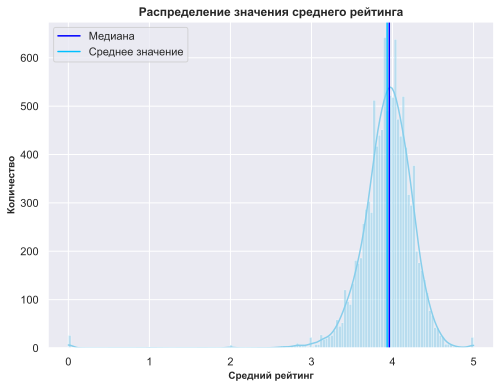

In [9]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.histplot(x='average_rating', data = df, color='skyblue', kde=True)
plt.axvline(df['average_rating'].median(), color='blue', label='Медиана')
plt.axvline(df['average_rating'].mean(), color='deepskyblue', label='Среднее значение')
plt.xlabel('Средний рейтинг', fontsize=10, fontweight='bold')
plt.ylabel('Количество', fontsize=10, fontweight='bold')
plt.title('Распределение значения среднего рейтинга', fontsize=12, fontweight='bold')
plt.legend()
plt.show()

In [10]:
ar_mean = df['average_rating'].mean()
ar_median = df['average_rating'].median()
print(f'Среднее значение рейтинга - {ar_mean:.4f}.')
print(f'Медианное значение рейтинга - {ar_median:.4f}.')

Среднее значение рейтинга - 3.9336.
Медианное значение рейтинга - 3.9600.


Обратим внимание, что среднее и медианное значение в данном случае практически идентичны. В целом распределение довольно похоже на нормальное, но присутствует тяжелый левый хвост, а точнее небольшой пик на нуле. Это может указывать на наличие наблюдений, для которых рейтинг не заполнен.

Результаты для конкретных годов могут отличаться. Например, среднее значение в выборке за 1999 год меньше, чем среднее по всей выборке.

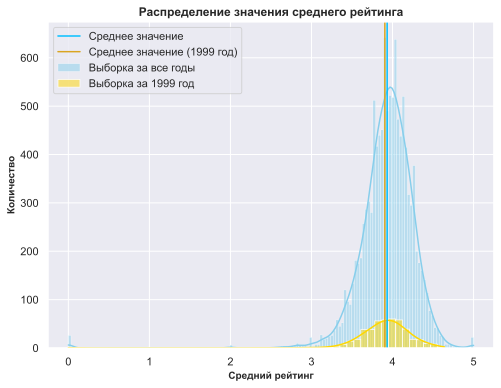

In [11]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.histplot(x='average_rating', data = df, color='skyblue', kde=True, label='Выборка за все годы')
sns.histplot(x='average_rating', data = df[df['Year'] == 1999], \
             color='gold', kde=True, label='Выборка за 1999 год')
plt.axvline(df['average_rating'].mean(), color='deepskyblue', label='Среднее значение')
plt.axvline(df.loc[df['Year'] == 1999,'average_rating'].mean(), \
            color='goldenrod', label='Среднее значение (1999 год)')
plt.xlabel('Средний рейтинг', fontsize=10, fontweight='bold')
plt.ylabel('Количество', fontsize=10, fontweight='bold')
plt.title('Распределение значения среднего рейтинга', fontsize=12, fontweight='bold')
plt.legend()
plt.show()

Изобразим также на графике распределения интервалы для среднего значения +- 1/2/3 сигмы. А затем определим какой процент наблюдений попадает в указанные границы.

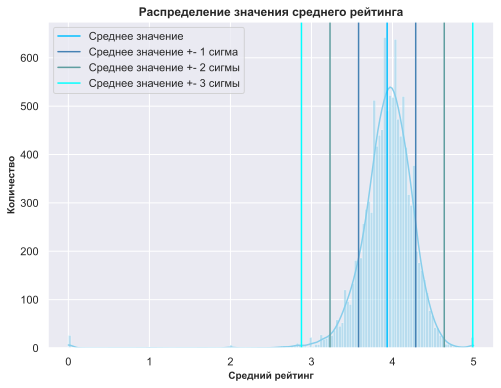

In [12]:
ar_std = df['average_rating'].std()

plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.histplot(x='average_rating', data = df, color='skyblue', kde=True)

plt.axvline(df['average_rating'].mean(), color='deepskyblue', label='Среднее значение')

plt.axvline(df['average_rating'].mean() - ar_std, color='steelblue')
plt.axvline(df['average_rating'].mean() + ar_std, color='steelblue', label='Среднее значение +- 1 сигма')

plt.axvline(df['average_rating'].mean() - 2*ar_std, color='cadetblue')
plt.axvline(df['average_rating'].mean() + 2*ar_std, color='cadetblue', label='Среднее значение +- 2 сигмы')

plt.axvline(df['average_rating'].mean() - 3*ar_std, color='aqua')
plt.axvline(df['average_rating'].mean() + 3*ar_std, color='aqua', label='Среднее значение +- 3 сигмы')

plt.xlabel('Средний рейтинг', fontsize=10, fontweight='bold')
plt.ylabel('Количество', fontsize=10, fontweight='bold')
plt.title('Распределение значения среднего рейтинга', fontsize=12, fontweight='bold')
plt.legend()
plt.show()

In [13]:
fraction_1sigma = df[(df['average_rating'] > df['average_rating'].mean() - ar_std) \
   & (df['average_rating'] < df['average_rating'].mean() + ar_std)].shape[0]/df.shape[0]
fraction_2sigma = df[(df['average_rating'] > df['average_rating'].mean() - 2*ar_std) \
   & (df['average_rating'] < df['average_rating'].mean() + 2*ar_std)].shape[0]/df.shape[0]
fraction_3sigma = df[(df['average_rating'] > df['average_rating'].mean() - 3*ar_std) \
   & (df['average_rating'] < df['average_rating'].mean() + 3*ar_std)].shape[0]/df.shape[0]
print(f'В интервале среднее значение +- 1 сигма находится {fraction_1sigma:.2%} значений рейтинга книг.')
print(f'В интервале среднее значение +- 2 сигма находится {fraction_2sigma:.2%} значений рейтинга книг.')
print(f'В интервале среднее значение +- 3 сигма находится {fraction_3sigma:.2%} значений рейтинга книг.')

В интервале среднее значение +- 1 сигма находится 79.36% значений рейтинга книг.
В интервале среднее значение +- 2 сигма находится 97.65% значений рейтинга книг.
В интервале среднее значение +- 3 сигма находится 99.16% значений рейтинга книг.


Теперь проанализируем количество оценок, которые получила книга - `ratings_count`.

In [14]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
g = sns.histplot(x='ratings_count', data = df, color='skyblue')
g.set(xscale='log')
plt.xlabel('Количество оценок книги (логарифмическая шкала)', fontsize=10, fontweight='bold')
plt.ylabel('Количество наблюдений', fontsize=10, fontweight='bold')
plt.title('Распределение количества оценок книги', fontsize=12, fontweight='bold')
plt.show()

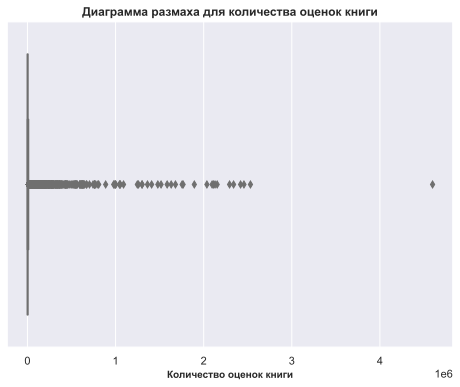

In [15]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.boxplot(x='ratings_count', data = df, color='skyblue')
plt.xlabel('Количество оценок книги', fontsize=10, fontweight='bold')
plt.title('Диаграмма размаха для количества оценок книги', fontsize=12, fontweight='bold')
plt.show()

Такой вид ящика с усами указывает на большое количество выбросов для данного признака. Посчитаем квантили:

In [16]:
print(f'Квантили для количества оценок книги:')
for i in np.arange(0.1, 1, 0.1):
    q_i = df['ratings_count'].quantile(q=i)
    print(f'Квантиль {i*100:.0f}% - {q_i:.2f}.') 

Квантили для количества оценок книги:
Квантиль 10% - 20.00.
Квантиль 20% - 65.00.
Квантиль 30% - 168.00.
Квантиль 40% - 352.00.
Квантиль 50% - 745.00.
Квантиль 60% - 1546.00.
Квантиль 70% - 3271.20.
Квантиль 80% - 7965.80.
Квантиль 90% - 24752.20.


Отсюда можно сделать вывод, что для _90%_ наблюдений количество оценок меньше значения __24752.20__. Тем не менее в датасете присутствует определенное количество выбросов (для некоторых книг количество оценок составляет несколько миллионов), которые особенно хорошо заметны на предыдущем графике.

In [17]:
df[df['ratings_count'] > df['ratings_count'].quantile(q=0.9)].shape[0]

1113

In [18]:
rc_q25 = df['ratings_count'].quantile(q=0.25)
rc_q75 = df['ratings_count'].quantile(q=0.75)
iqr = rc_q75 - rc_q25
df[(df['ratings_count'] < rc_q25 - 1.5*iqr) | (df['ratings_count'] > rc_q75 + 1.5*iqr)].shape[0]

1729

Логично ожидать похожей картины для количества рецензий - `text_reviews_count`. По-видимому в представленном наборе данных есть малочисленная группа книг, на которые было написано множество рецензий, однако для большинства книг эта величина значительно меньше.

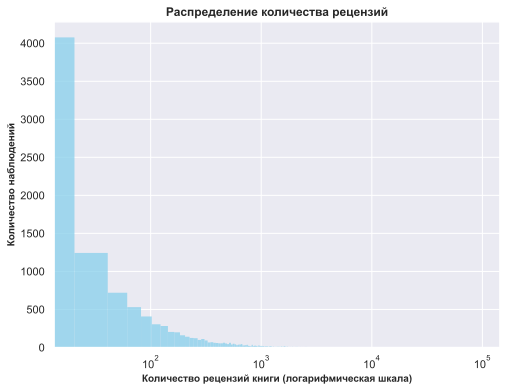

In [19]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
g = sns.histplot(x='text_reviews_count', data = df, color='skyblue')
g.set(xscale='log')
plt.xlabel('Количество рецензий книги (логарифмическая шкала)', fontsize=10, fontweight='bold')
plt.ylabel('Количество наблюдений', fontsize=10, fontweight='bold')
plt.title('Распределение количества рецензий', fontsize=12, fontweight='bold')
plt.show()

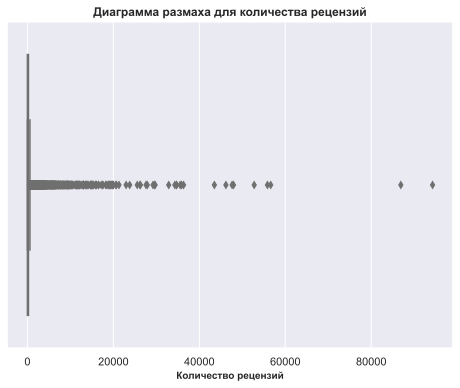

In [20]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.boxplot(x='text_reviews_count', data = df, color='skyblue')
plt.xlabel('Количество рецензий', fontsize=10, fontweight='bold')
plt.title('Диаграмма размаха для количества рецензий', fontsize=12, fontweight='bold')
plt.show()

In [21]:
print(f'Квантили для количества рецензий:')
for i in np.arange(0.1, 1, 0.1):
    q_i = df['text_reviews_count'].quantile(q=i)
    print(f'Квантиль {i*100:.0f}% - {q_i:.2f}.')

Квантили для количества рецензий:
Квантиль 10% - 2.00.
Квантиль 20% - 6.00.
Квантиль 30% - 13.00.
Квантиль 40% - 26.00.
Квантиль 50% - 46.00.
Квантиль 60% - 87.00.
Квантиль 70% - 165.00.
Квантиль 80% - 352.00.
Квантиль 90% - 963.20.


Несмотря на то, что для _90%_ книг количество рецензий не превышает __1000__, существуют произведения, на которые было написано более __20000__ рецензий.

In [22]:
df.loc[df['text_reviews_count'] == df['text_reviews_count'].max(), 'title']

10340    Twilight (Twilight  #1)
Name: title, dtype: object

Как видим наибольшее количество рецензий было написано на первую часть Сумерек.

Проанализируем признак описывающий количество страниц в книге - `num_pages`.

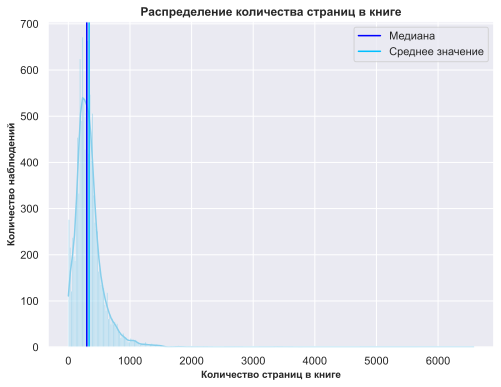

In [23]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.histplot(x='num_pages', data = df, color='skyblue', kde=True)
plt.axvline(df['num_pages'].median(), color='blue', label='Медиана')
plt.axvline(df['num_pages'].mean(), color='deepskyblue', label='Среднее значение')
plt.xlabel('Количество страниц в книге', fontsize=10, fontweight='bold')
plt.ylabel('Количество наблюдений', fontsize=10, fontweight='bold')
plt.title('Распределение количества страниц в книге', fontsize=12, fontweight='bold')
plt.legend()
plt.show()

Здесь заметно наличие тяжелого правого хвоста, так как в датасете присутствует достаточно книг, количество страниц в которых в разы превосходит среднее значение.

In [24]:
np_mean = df['num_pages'].mean()
np_median = df['num_pages'].median()
np_std = df['num_pages'].std()
print(f'Среднее значение количества страниц в книге - {np_mean:.4f}.')
print(f'Медианное значение количества страниц в книге - {np_median:.4f}.')
print(f'Стандартное отклонение количества страниц в книге - {np_std:.4f}.')

Среднее значение количества страниц в книге - 336.3769.
Медианное значение количества страниц в книге - 299.0000.
Стандартное отклонение количества страниц в книге - 241.1273.


Среднее значение превышающее медиану в данном случае также указывает на наличие выбросов.

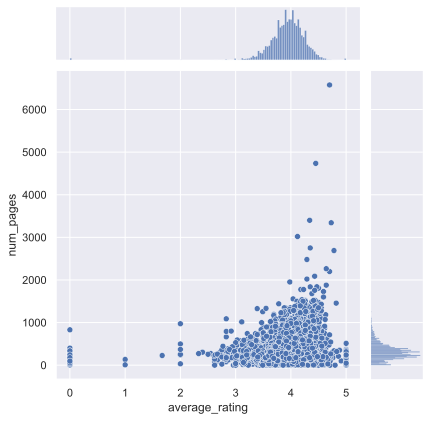

In [25]:
# Совместное распределение среднего рейтинга и количество страниц
sns.set(style='darkgrid')
sns.jointplot(data=df, x='average_rating', y='num_pages', kind='scatter')
plt.show()

In [26]:
df.loc[df['num_pages'] > 6000, :]

,title,authors,average_rating,language_code,ratings_count,text_reviews_count,publisher,num_pages,Year,Month,Day,Weekday
6500,The Complete Aubrey/Maturin Novels (5 Volumes),Patrick O'Brian,4.7,eng,1338,81,W. W. Norton Company,6576,2004,10,17,Sunday


Несмотря на то, что эта книга очень объемная и содержит _6500_ страниц, читатели и критики оценили ее очень высоко. Вообще из предыдущего графика можно заметить, что объемные книги (которые содержат более 2000 страниц) имеют очень высокие средние оценки.

Теперь перейдем к анализу признаков `Year`, `Month` и `Day`, полученных из изначальной переменной `publication_date`.

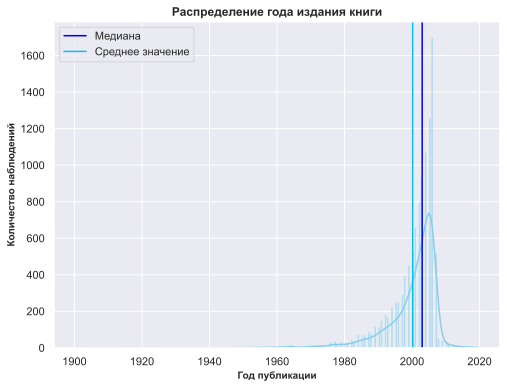

In [27]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.histplot(x='Year', data = df, color='skyblue', kde=True)
plt.axvline(df['Year'].median(), color='blue', label='Медиана')
plt.axvline(df['Year'].mean(), color='deepskyblue', label='Среднее значение')
plt.xlabel('Год публикации', fontsize=10, fontweight='bold')
plt.ylabel('Количество наблюдений', fontsize=10, fontweight='bold')
plt.title('Распределение года издания книги', fontsize=12, fontweight='bold')
plt.legend()
plt.show()

In [28]:
year_mean = df['Year'].mean()
year_median = df['Year'].median()
print(f'Среднее значение года публикации - {year_mean:.4f}.')
print(f'Медианное значение года публикации - {year_median:.4f}.')

Среднее значение года публикации - 2000.1675.
Медианное значение года публикации - 2003.0000.


Это позволяет утверждать, что в датасете сделан упор на современные книги, вышедшие в 2000х, так как книги опубликованные после 2003 года составляют 50% выборки. Самое "раннее" произведение было выпущено в 1900 году.

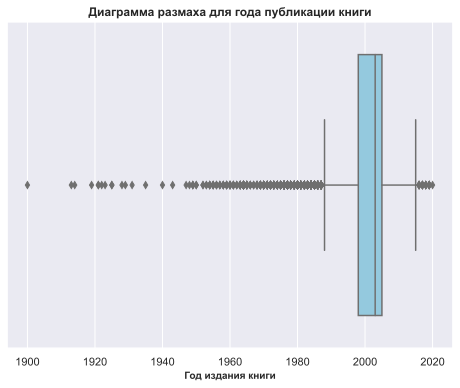

In [29]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.boxplot(x='Year', data = df, color='skyblue')
plt.xlabel('Год издания книги', fontsize=10, fontweight='bold')
plt.title('Диаграмма размаха для года публикации книги', fontsize=12, fontweight='bold')
plt.show()

In [30]:
year_q25 = df['Year'].quantile(q=0.25)
year_q75 = df['Year'].quantile(q=0.75)
print(f'Квантиль 25% - {year_q25:.4f}.')
print(f'Квантиль 75% - {year_q75:.4f}.')
print(f'Квантиль 25% - 1.5*IQR - {year_q25-1.5*(year_q75-year_q25):.4f}.')
print(f'Квантиль 75% + 1.5*IQR  - {year_q75+1.5*(year_q75-year_q25):.4f}.')

Квантиль 25% - 1998.0000.
Квантиль 75% - 2005.0000.
Квантиль 25% - 1.5*IQR - 1987.5000.
Квантиль 75% + 1.5*IQR  - 2015.5000.


Основная масса наблюдений в датасете находится в интервале между 1987 и 2016 годами.

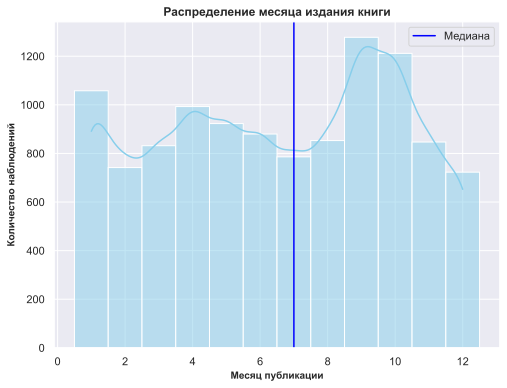

In [31]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.histplot(x='Month', data = df, color='skyblue', kde=True, bins=12, discrete=True)
plt.axvline(df['Month'].median(), color='blue', label='Медиана')
plt.xlabel('Месяц публикации', fontsize=10, fontweight='bold')
plt.ylabel('Количество наблюдений', fontsize=10, fontweight='bold')
plt.title('Распределение месяца издания книги', fontsize=12, fontweight='bold')
plt.legend()
plt.show()

Видно, что в августе-декабре публикуется практически столько же книг, сколько с января по июль. На графике присутствуют логичные пики в начале осени, когда наблюдается оживление после отпускного/летнего сезона (когда наоборот заметен спад в публикациях). Так же много книг выходит в январе, начале года. Локальный пик заметен в апреле, когда на мой взгляд публикуются книги, которые должны привлечь внимание аудитории на время отпусков.

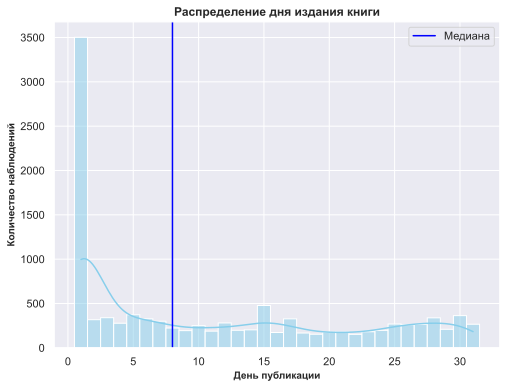

In [32]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.histplot(x='Day', data = df, color='skyblue', kde=True, bins=31, discrete=True)
plt.axvline(df['Day'].median(), color='blue', label='Медиана')
plt.xlabel('День публикации', fontsize=10, fontweight='bold')
plt.ylabel('Количество наблюдений', fontsize=10, fontweight='bold')
plt.title('Распределение дня издания книги', fontsize=12, fontweight='bold')
plt.legend()
plt.show()

Подавляющее большинство книг выходит в первый день месяца, с этим связана так сильно смещенная влево медиана. Локальный пик есть в середине месяца - 15ого числа, однако он ничтожен по сравнению с объемом публикаций первого числа месяца.

### Качественные переменные

Информация, содержащаяся в столбце `title`, позволит только сделать вывод о том, насколько часто произведение переиздавалось.

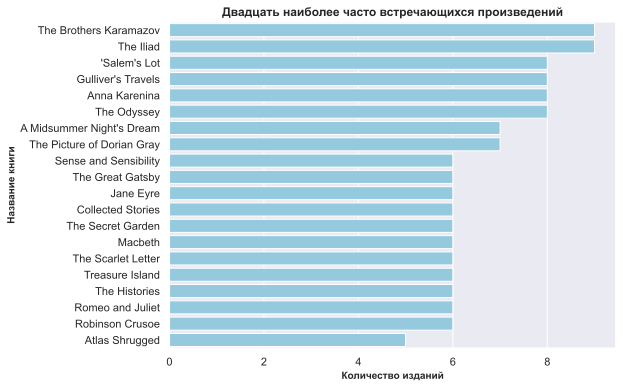

In [33]:
# Сформируем отдельный датасет, в котором будут содержаться только двадцать наиболее часто встречающихся книг
tvc = pd.DataFrame(df['title'].value_counts()).reset_index().iloc[:20, :]

# Визуализация сформированного датасета
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.barplot(y='index', x='title', data = tvc, color='skyblue')
plt.xlabel('Количество изданий', fontsize=10, fontweight='bold')
plt.ylabel('Название книги', fontsize=10, fontweight='bold')
plt.title('Двадцать наиболее часто встречающихся произведений', fontsize=12, fontweight='bold')
plt.show()

Аналогичным образом можно посмотреть какие авторы чаще всего встречаются в представленном наборе данных. Для этого визуализируем признак `authors`.

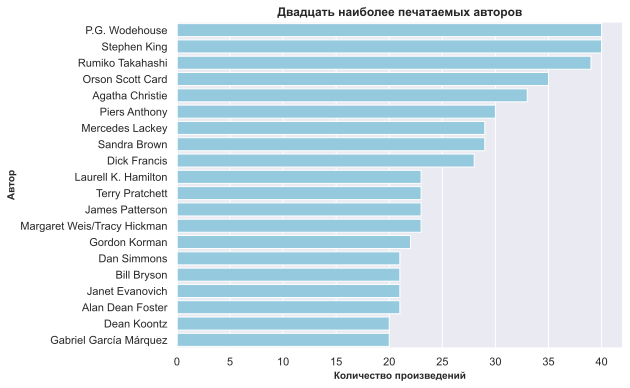

In [34]:
# Сформируем отдельный датасет, в котором будут содержаться только двадцать наиболее часто встречающихся авторов
avc = pd.DataFrame(df['authors'].value_counts()).reset_index().iloc[:20, :]

# Визуализация сформированного датасета
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.barplot(y='index', x='authors', data = avc, color='skyblue')
plt.xlabel('Количество произведений', fontsize=10, fontweight='bold')
plt.ylabel('Автор', fontsize=10, fontweight='bold')
plt.title('Двадцать наиболее печатаемых авторов', fontsize=12, fontweight='bold')
plt.show()

Аналогичным образом можно визуализировать популярных авторов в зависимости от года. Картина для 2005 года значительно отличается от агрегированных результатов.

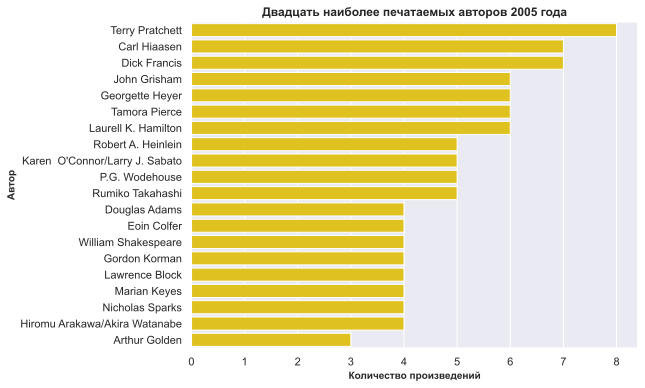

In [35]:
# Сформируем отдельный датасет, в котором будут содержаться только двадцать наиболее часто встречающихся авторов 
# 2005 года
avc = pd.DataFrame(df.loc[df['Year']==2005, 'authors'].value_counts()).reset_index().iloc[:20, :]

# Визуализация сформированного датасета
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.barplot(y='index', x='authors', data = avc, color='gold')
plt.xlabel('Количество произведений', fontsize=10, fontweight='bold')
plt.ylabel('Автор', fontsize=10, fontweight='bold')
plt.title('Двадцать наиболее печатаемых авторов 2005 года', fontsize=12, fontweight='bold')
plt.show()

Проанализируем распределение книг по параметру языка - `language_code`.

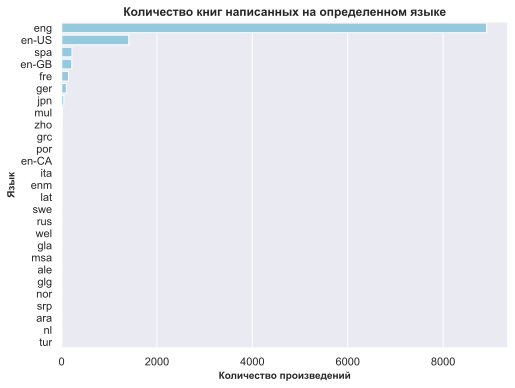

In [36]:
lcvc = pd.DataFrame(df['language_code'].value_counts()).reset_index()

# Визуализация сформированного датасета
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.barplot(y='index', x='language_code', data = lcvc, color='skyblue')
plt.xlabel('Количество произведений', fontsize=10, fontweight='bold')
plt.ylabel('Язык', fontsize=10, fontweight='bold')
plt.title('Количество книг написанных на определенном языке', fontsize=12, fontweight='bold')
plt.show()

Видим, что подавляющее большинство книг написано по-английски либо на его вариантах (en-US, en-GB, en-CA). Учитывая большую диспропорцию результатов, воспользуемся логарифмической шкалой для лучшей визуализации.

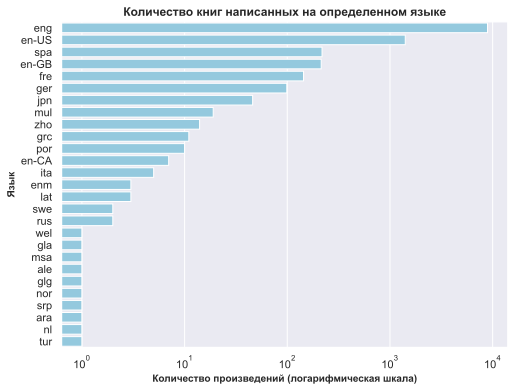

In [37]:
lcvc = pd.DataFrame(df['language_code'].value_counts()).reset_index()

# Визуализация сформированного датасета
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
g=sns.barplot(y='index', x='language_code', data = lcvc, color='skyblue')
g.set(xscale='log')
plt.xlabel('Количество произведений (логарифмическая шкала)', fontsize=10, fontweight='bold')
plt.ylabel('Язык', fontsize=10, fontweight='bold')
plt.title('Количество книг написанных на определенном языке', fontsize=12, fontweight='bold')
plt.show()

Визуализируем аналогичным образом наиболее часто встречающиеся издательства в рассматриваемом датасете.

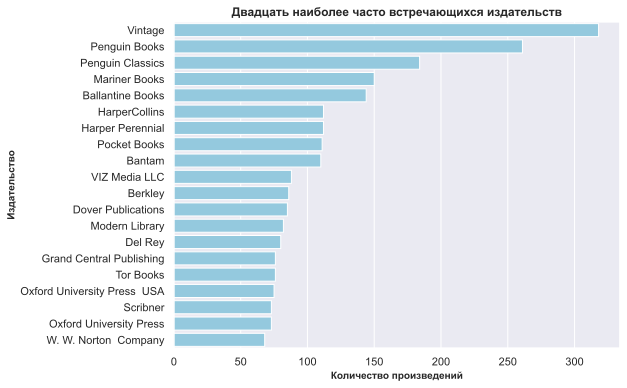

In [38]:
# Сформируем отдельный датасет, в котором будут содержаться только двадцать наиболее часто встречающихся издательств
pvc = pd.DataFrame(df['publisher'].value_counts()).reset_index().iloc[:20, :]

# Визуализация сформированного датасета
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.barplot(y='index', x='publisher', data = pvc, color='skyblue')
plt.xlabel('Количество произведений', fontsize=10, fontweight='bold')
plt.ylabel('Издательство', fontsize=10, fontweight='bold')
plt.title('Двадцать наиболее часто встречающихся издательств', fontsize=12, fontweight='bold')
plt.show()

Аналогичным образом можно визуализировать самые популярные издательства в разных годах. Как видим картина для 2006 года отличается от агрегированных результатов.

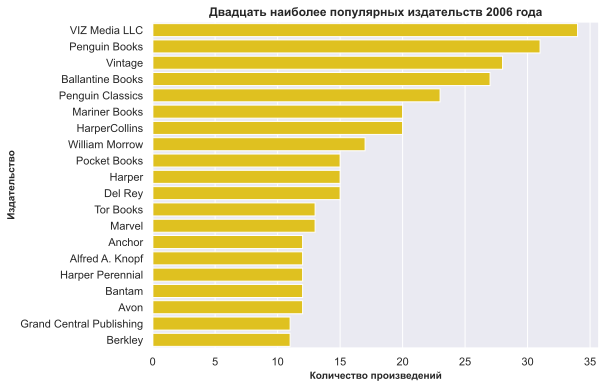

In [39]:
# Сформируем отдельный датасет, в котором будут содержаться только двадцать наиболее часто встречающихся издательств
# 2006 года
pvc = pd.DataFrame(df.loc[df['Year'] == 2006,'publisher'].value_counts()).reset_index().iloc[:20, :]

# Визуализация сформированного датасета
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.barplot(y='index', x='publisher', data = pvc, color='gold')
plt.xlabel('Количество произведений', fontsize=10, fontweight='bold')
plt.ylabel('Издательство', fontsize=10, fontweight='bold')
plt.title('Двадцать наиболее популярных издательств 2006 года', fontsize=12, fontweight='bold')
plt.show()

Используя сгенерированный признак `Weekday`, построим распределени изданных книг в зависимости от дня недели.

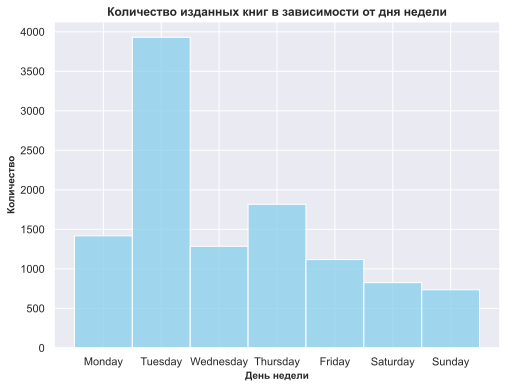

In [40]:
plt.figure(figsize=(8,6))
sns.set(style='darkgrid')
sns.histplot(x='Weekday', data = df, color='skyblue')
plt.xlabel('День недели', fontsize=10, fontweight='bold')
plt.ylabel('Количество', fontsize=10, fontweight='bold')
plt.title('Количество изданных книг в зависимости от дня недели', fontsize=12, fontweight='bold')
plt.show()

Как видно большинство книг издается во вторники и четверги, а в субботы и воскресенья выходит наименьшее количество книг.